# Preprocessing for Segmentation

## Data Augmentation

<br />

"albu/albumentations"


https://github.com/albu/albumentations/blob/master/notebooks/example_kaggle_salt.ipynb

In [7]:
import glob

import cv2
import numpy as np
from albumentations import (CLAHE, CenterCrop, Compose, Crop, ElasticTransform,
                            GridDistortion, HorizontalFlip, OneOf,
                            OpticalDistortion, PadIfNeeded,
                            RandomBrightnessContrast, RandomGamma,
                            RandomRotate90, RandomSizedCrop, Transpose,
                            VerticalFlip)
from matplotlib import pyplot as plt
from PIL import Image

In [3]:
# Definition for visualizing augmented results


def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 18

    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)

        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)

        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)

        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

In [18]:
# Get paths

path = "new_dataset/train/rwanda/"

image_files = glob.glob(path + "image/*.png")
mask_files = glob.glob(path + "label/*.png")

In [19]:
# Set a shape

image_size = 256

### 1st Try

In [20]:
aug_heavy = Compose([
    OneOf([RandomSizedCrop(min_max_height=(50, 101), height=image_size, width=image_size, p=0.5),
           PadIfNeeded(min_height=image_size, min_width=image_size, p=0.5)], p=1),
    VerticalFlip(p=0.5),
    RandomRotate90(p=0.5),
    OneOf([
        ElasticTransform(p=0.5, alpha=120, sigma=120 *
                         0.05, alpha_affine=120 * 0.03),
        GridDistortion(p=0.5),
        OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)
    ], p=0.8),
    CLAHE(p=0.8),
    RandomBrightnessContrast(p=0.8),
    RandomGamma(p=0.8)])

In [21]:
# Augmentation

for i, (image, mask) in enumerate(zip(image_files, mask_files)):
    image = Image.open(image)
    mask = Image.open(mask)
    image = image.convert("RGB")
    mask = mask.convert("RGB")
    image = image.resize((image_size, image_size))
    mask = mask.resize((image_size, image_size))
    image = np.asarray(image)
    mask = np.asarray(mask)
    for j in range(10):
        augmented = aug_heavy(image=image, mask=mask)
        image = augmented['image']
        mask = augmented['mask']
        Image.fromarray(image).save(
            'new_dataset/train/rwanda/augmentation/image/' + str(i) + "-" + str(j) + ".png")
        Image.fromarray(mask).save(
            'new_dataset/train/rwanda/augmentation/label/' + str(i) + "-" + str(j) + ".png")

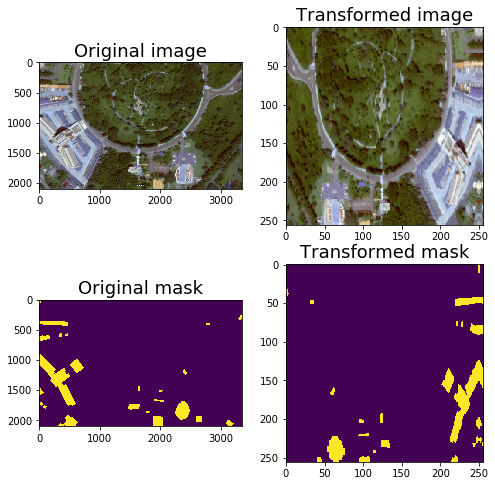

In [25]:
# Check the results

image = cv2.imread('new_dataset/train/rwanda/image/48.png')
mask = cv2.imread('new_dataset/train/rwanda/label/48.png', 0)
image_heavy = cv2.imread('new_dataset/train/rwanda/augmentation/image/0-0.png')
mask_heavy = cv2.imread(
    'new_dataset/train/rwanda/augmentation/label/0-0.png', 0)

visualize(image_heavy, mask_heavy,
          original_image=image, original_mask=mask)

    - The numbers do not match. This might be because images were taken randomly.

## Sharpening Filters

<br />

I am going to try to sharpen images by using 2 different sharpening filters including low/soft sharpening and high/strong sharpening.


After sharpening, I will apply a Bilateral filter for noise reduction produced by sharpening.

In [30]:
# Low/Soft sharpening filter


def low_sharpen(img):
    # Low sharpening
    kernel_sharp = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    # Image sharpening
    img_sharpened = cv2.filter2D(img, -1, kernel_sharp)
    # Noise reduction
    img_sharpened = cv2.bilateralFilter(img_sharpened, 3, 75, 75)
    return img_sharpened

In [31]:
# High/Strong sharpening filter


def high_sharpen(img):
    # High sharpening
    kernel_sharp = np.array([[-2, -2, -2], [-2, 17, -2], [-2, -2, -2]])
    # Image sharpening
    img_sharpened = cv2.filter2D(img, -1, kernel_sharp)
    # Noise reduction
    img_sharpened = cv2.bilateralFilter(img_sharpened, 9, 100, 100)
    return img_sharpened

In [27]:
# Create a list of paths of train images

image_path = "new_dataset/train/rwanda/image/"

path_list = []
for i in range(50):
    path = image_path + str(i) + ".png"
    path_list.append(path)

In [28]:
# Check

path_list

['new_dataset/train/rwanda/image/0.png',
 'new_dataset/train/rwanda/image/1.png',
 'new_dataset/train/rwanda/image/2.png',
 'new_dataset/train/rwanda/image/3.png',
 'new_dataset/train/rwanda/image/4.png',
 'new_dataset/train/rwanda/image/5.png',
 'new_dataset/train/rwanda/image/6.png',
 'new_dataset/train/rwanda/image/7.png',
 'new_dataset/train/rwanda/image/8.png',
 'new_dataset/train/rwanda/image/9.png',
 'new_dataset/train/rwanda/image/10.png',
 'new_dataset/train/rwanda/image/11.png',
 'new_dataset/train/rwanda/image/12.png',
 'new_dataset/train/rwanda/image/13.png',
 'new_dataset/train/rwanda/image/14.png',
 'new_dataset/train/rwanda/image/15.png',
 'new_dataset/train/rwanda/image/16.png',
 'new_dataset/train/rwanda/image/17.png',
 'new_dataset/train/rwanda/image/18.png',
 'new_dataset/train/rwanda/image/19.png',
 'new_dataset/train/rwanda/image/20.png',
 'new_dataset/train/rwanda/image/21.png',
 'new_dataset/train/rwanda/image/22.png',
 'new_dataset/train/rwanda/image/23.png',
 '

In [32]:
# Sharpen images

for i, path in enumerate(path_list):
    image = Image.open(path)
    image = image.convert("RGB")
    image = image.resize((image_size, image_size))
    image = np.asarray(image)
    # Sharpening
    low = low_sharpen(image)
    high = high_sharpen(image)
    # Save
    Image.fromarray(low).save(
        'new_dataset/train/rwanda/image_low_sharpened/' + str(i) + ".png")
    Image.fromarray(high).save(
        'new_dataset/train/rwanda/image_high_sharpened/' + str(i) + ".png")

In [2]:
from IPython.display import Image, display_png

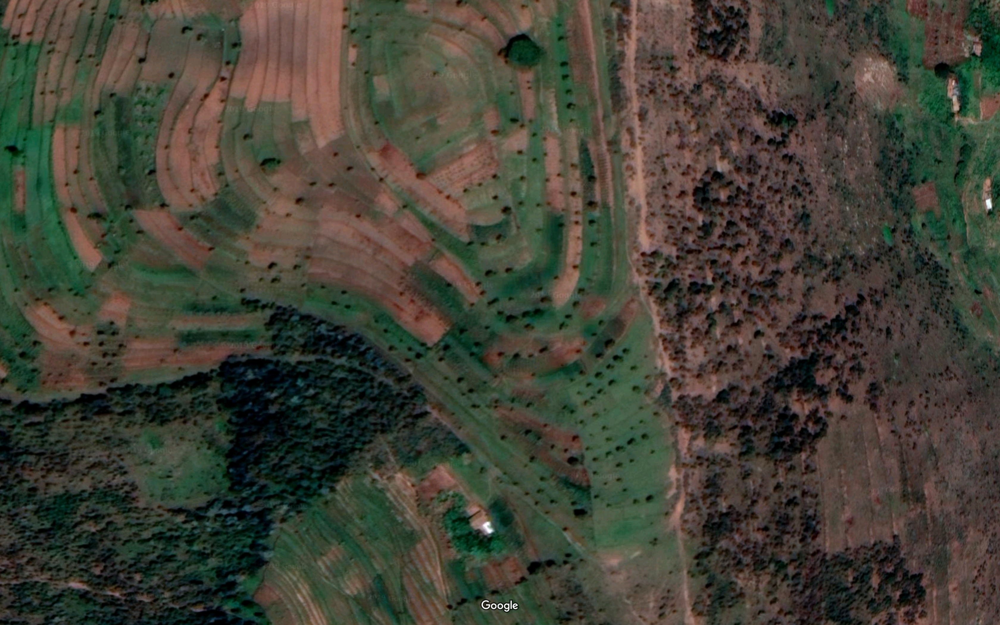

In [3]:
# Check the results

# Original
display_png(Image('new_dataset/train/rwanda/image/0.png'))

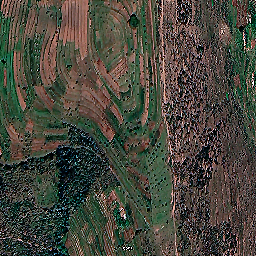

In [4]:
# Low filtered
display_png(Image("new_dataset/train/rwanda/image_low_sharpened/0.png"))

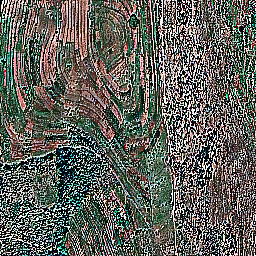

In [5]:
# High filtered
display_png(Image('new_dataset/train/rwanda/image_high_sharpened/0.png'))